---

### 🎓 **Professor**: Apostolos Filippas

### 📘 **Class**: AI Engineering

### 📋 **Homework 6**: Multimodal Image Search

### 📅 **Due Date**: Day of Lecture 9, 11:59 PM

### Difficulty: ★★★★☆

**Note**: You are not allowed to share the contents of this notebook with anyone outside this class without written permission by the professor.

---

### Instructions

1. Use any external resource or collaborate with your classmates. But you have to cite external resources you've used and mention classmates you've collaborated with.
2. Run all cells before submitting to ensure they work.
3. Some tasks involve LLM API calls that cost money. Budget wisely.
4. I suggest you save intermediate results (descriptions, metadata) to a `temp/` folder so that you don't re-run expensive API calls.

## 1. Setup & Explore

The `../data/dogs/` directory contains dog images.
- These include different breeds, artistic styles (photographs, sketches, paintings, cartoons), settings, and some images with text or unusual content.

### Load and display images

Load all `.png` file paths from `../data/dogs/`, sorted by name. 
- Explore the data
- How many images are there? Are they AI generated? What type of variety do you observe? What breeds do you see? What artistic styles? Any images that look unusual or have text?

In [1]:
import os
from pathlib import Path
from PIL import Image
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

# Load all .png file paths, sorted by name
data_dir = Path("../data/dogs/")
image_paths = sorted(data_dir.glob("*.png"))

print(f"Total images: {len(image_paths)}")
print("\nFile names:")
for p in image_paths:
    print(p.name)

Total images: 100

File names:
dog_001.png
dog_002.png
dog_003.png
dog_004.png
dog_005.png
dog_006.png
dog_007.png
dog_008.png
dog_009.png
dog_010.png
dog_011.png
dog_012.png
dog_013.png
dog_014.png
dog_015.png
dog_016.png
dog_017.png
dog_018.png
dog_019.png
dog_020.png
dog_021.png
dog_022.png
dog_023.png
dog_024.png
dog_025.png
dog_026.png
dog_027.png
dog_028.png
dog_029.png
dog_030.png
dog_031.png
dog_032.png
dog_033.png
dog_034.png
dog_035.png
dog_036.png
dog_037.png
dog_038.png
dog_039.png
dog_040.png
dog_041.png
dog_042.png
dog_043.png
dog_044.png
dog_045.png
dog_046.png
dog_047.png
dog_048.png
dog_049.png
dog_050.png
dog_051.png
dog_052.png
dog_053.png
dog_054.png
dog_055.png
dog_056.png
dog_057.png
dog_058.png
dog_059.png
dog_060.png
dog_061.png
dog_062.png
dog_063.png
dog_064.png
dog_065.png
dog_066.png
dog_067.png
dog_068.png
dog_069.png
dog_070.png
dog_071.png
dog_072.png
dog_073.png
dog_074.png
dog_075.png
dog_076.png
dog_077.png
dog_078.png
dog_079.png
dog_080.png
dog_081.p

## 2. The Task

Your goal is to build a **searchable index** over these dog images that allows us to find relevant images using natural language queries, metadata filters, or both.

There are broadly two approaches:

**Approach A: Text-based pipeline**
1. Use a vision LLM to generate text descriptions of each image
2. Extract structured metadata (breed, style, setting, etc.) using an LLM with structured output
3. Embed the descriptions and build a searchable index (e.g., using LanceDB)
4. Search using semantic similarity over text + metadata filters

**Approach B: Multimodal embeddings**
1. Use a multimodal embedding model to embed the images directly
2. Embed text queries in the same space
3. Search by comparing query embeddings to image embeddings

You may combine both approaches or use a different method entirely. Use any tools from the course — `litellm`, `lancedb`, `pydantic`, `sentence-transformers` - or any other tools you want.


In [ ]:
from google import genai
from pathlib import Path
from PIL import Image
from dotenv import load_dotenv

load_dotenv()

# Setup API key
google_client = genai.Client(api_key=os.environ.get("GOOGLE_API_KEY"))



def generate_description(image_path):
    img = Image.open(image_path)
    
    response = google_client.models.generate_content(
    model="gemini-2.5-flash",
    contents = [img,
        "Describe this dog image in detail. Include the breed, artistic style (photo/sketch/painting/cartoon), setting/background, mood, colors, and any unusual elements or text visible."
    ])
    return response.text

# Test
desc = generate_description(image_paths[0])
print(desc)

This image is a vibrant and detailed **photograph** capturing a joyful moment with a dog.

**Breed:** The dog is clearly a **Golden Retriever**, identifiable by its characteristic medium-length golden fur, friendly facial features, and overall build.

**Artistic Style:** The style is a highly **realistic photograph**, exhibiting sharp focus on the subject (the dog) and a pleasing depth of field with a softly blurred background. The lighting is natural and bright, suggesting a sunny day.

**Setting/Background:** The scene is set in an expansive **outdoor park or large grassy field**. The foreground and midground consist of lush, vibrant green grass, dotted with small bright specks that could be dew, water droplets, or pollen illuminated by the sun. In the background, there are numerous mature, deciduous trees with full green canopies, creating a natural, somewhat dappled light effect. Beyond the trees and further in the distance, blurred human figures can be seen walking along what appe

In [12]:
descriptions = {}

for path in image_paths:
    try:
        print(f"Processing {path.name}...")
        descriptions[path.name] = generate_description(path)
    except Exception as e:
        print(f"❌ Error on {path.name}: {e}")
        descriptions[path.name] = None

print(f"✅ Done! {len(descriptions)} images processed")

Processing dog_001.png...
Processing dog_002.png...
Processing dog_003.png...
Processing dog_004.png...
Processing dog_005.png...
Processing dog_006.png...
Processing dog_007.png...
Processing dog_008.png...
Processing dog_009.png...
Processing dog_010.png...
Processing dog_011.png...
Processing dog_012.png...
Processing dog_013.png...
Processing dog_014.png...
Processing dog_015.png...
Processing dog_016.png...
Processing dog_017.png...
Processing dog_018.png...
Processing dog_019.png...
Processing dog_020.png...
Processing dog_021.png...
Processing dog_022.png...
Processing dog_023.png...
Processing dog_024.png...
Processing dog_025.png...
Processing dog_026.png...
Processing dog_027.png...
Processing dog_028.png...
Processing dog_029.png...
Processing dog_030.png...
Processing dog_031.png...
Processing dog_032.png...
Processing dog_033.png...
Processing dog_034.png...
Processing dog_035.png...
Processing dog_036.png...
Processing dog_037.png...
Processing dog_038.png...
Processing d

In [ ]:
import json
#save local
with open("descriptions.json", "w", encoding="utf-8") as f:
    json.dump(descriptions, f, ensure_ascii=False, indent=2)

print("✅ Saved to descriptions.json")

✅ Saved to descriptions.json


In [ ]:
import json
from pydantic import BaseModel, Field
from typing import Literal

class Img_des(BaseModel): #Ref on Lecture 2 Notebook
    """Structured representation of a dog image description."""
    breed: str = Field(description="The breed of the dog")
    img_style: Literal["photograph",'painting','sketch','cartoon'] = Field(description = "The image style. How it is presented")
    setting: str = Field(description = "Where is the dog at?")
    mood: str = Field(description= "Tone and mood of the image")
    colors: str = Field(description="Image main color palette")
    has_textNone = Field(default = None, description="Image's texts or unusual elements")

    pass

In [ ]:
import litellm

def extract_data(description: str) -> Img_des: #ref on lecture 2 notebook
    """
    Use LiteLLM with structured outputs to extract image description data.
    
    Args:
        description: A text description of an image
        
    Returns:
        A Img_des object with the extracted data
    """
    response = litellm.completion(
        model= "gpt-5-mini",
        messages=[{"role":"user", "content":description}],
        response_format=Img_des
    )
    return Img_des.model_validate_json(response.choices[0].message.content)

 
    pass

In [ ]:
#generate output
desc_structured_output = {}
for filename, desc in descriptions.items():
    try:
        print(f'Processing {filename}..')
        desc_output = extract_data(desc)
        desc_structured_output[filename] = desc_output.model_dump()
    except Exception as e:
        print(f"❌ Error on {filename}: {e}")



with open("descriptions_structured_output.json", "w", encoding="utf-8") as f:
    json.dump(desc_structured_output, f, ensure_ascii=False, indent=2)

print("✅ Saved to descriptions_structured_output.json")

Processing dog_001.png..
Processing dog_002.png..
Processing dog_003.png..
Processing dog_004.png..
Processing dog_005.png..
Processing dog_006.png..
Processing dog_007.png..
Processing dog_008.png..
Processing dog_009.png..
Processing dog_010.png..
Processing dog_011.png..
Processing dog_012.png..
Processing dog_013.png..
Processing dog_014.png..
Processing dog_015.png..
Processing dog_016.png..
Processing dog_017.png..
Processing dog_018.png..
Processing dog_019.png..
Processing dog_020.png..
Processing dog_021.png..
Processing dog_022.png..
Processing dog_023.png..
Processing dog_024.png..
Processing dog_025.png..
Processing dog_026.png..
Processing dog_027.png..
Processing dog_028.png..
Processing dog_029.png..
Processing dog_030.png..
Processing dog_031.png..
Processing dog_032.png..
Processing dog_033.png..
Processing dog_034.png..
Processing dog_035.png..
Processing dog_036.png..
Processing dog_037.png..
Processing dog_038.png..
Processing dog_039.png..
Processing dog_040.png..


In [16]:
print(desc_structured_output['dog_001.png'])

{'breed': 'Golden Retriever', 'img_style': 'photograph', 'setting': 'Sun-drenched park / large grassy field — bright, slightly dewy foreground grass; a subtle winding path in the midground with faint, blurred human figures; a line of mature trees in the background creating strong bokeh from sunlight filtering through leaves.', 'mood': 'Joyful, energetic, playful — exuberant canine happiness captured mid-run.', 'colors': 'Vibrant greens (lime to emerald) in grass and foliage; warm golden-orange fur; yellow-green tennis ball; pink tongue and dark mouth interior; muted dark clothing and brown tones in distant figures and path; overall bright, warm daylight.', 'unusual_ele': 'Dog captured fully airborne with all four paws off the ground; sparkling illuminated water droplets/dust motes visible in the air adding a subtle magical shimmer; no visible text or branding.'}


In [ ]:
#embed desc as vector then save
from sentence_transformers import SentenceTransformer
import lancedb

db = lancedb.connect("./dog_index")

embedder = SentenceTransformer("all-MiniLM-L6-v2")

vector_data = []
for filename, meta in desc_structured_output.items():
    text = descriptions[filename]
    vector = embedder.encode(text).tolist()

    vector_data.append({
        "filename": filename,
        "vector": vector,
        **meta #unpack dictionary
    })

table = db.create_table("dogs", data= vector_data, mode = "overwrite")
print(f"Indexed {len(vector_data)} images")

c:\Users\khanh\ai-engineering-fordham\.venv\Lib\site-packages\tqdm\auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Loading weights: 100%|██████████| 103/103 [00:00<00:00, 276.85it/s, Materializing param=pooler.dense.weight]                             
BertModel LOAD REPORT from: sentence-transformers/all-MiniLM-L6-v2
Key                     | Status     |  | 
------------------------+------------+--+-
embeddings.position_ids | UNEXPECTED |  | 

Notes:
- UNEXPECTED	:can be ignored when loading from different task/architecture; not ok if you expect identical arch.


Indexed 100 images


In [ ]:
#create search function
def search(query: str, artistic_style: str = None, breed: str = None, setting: str = None, top_k: int = 5):
    #embed query to vector 
    query_vector = embedder.encode(query).tolist()
    
    # Search in LanceDB
    results = table.search(query_vector).limit(top_k)
    
    # add filter if needed
    if artistic_style:
        results = results.where(f"img_style = '{artistic_style}'")
    if breed:
        results = results.where(f"breed = '{breed}'")
    if setting:
        results = results.where(f"breed = '{setting}'")

    return results.to_pandas()

In [22]:
# return image
from PIL import Image
import matplotlib.pyplot as plt

def show_results(results):
    fig, axes = plt.subplots(1, len(results), figsize=(20, 5))
    for i, row in results.iterrows():
        img = Image.open(f"../data/dogs/{row['filename']}")
        axes[i].imshow(img)
        axes[i].set_title(f"{row['filename']}\n{row['breed']}", fontsize=8)
        axes[i].axis("off")
    plt.tight_layout()
    plt.show()



## 3. Your Own Queries

To make a good search system, you will need to come up with some of your own queries and "golden" answers to these queries to evaluate your system with. Show us your work.

      filename                                              breed   img_style  \
0  dog_001.png                                   Golden Retriever  photograph   
1  dog_002.png                                   Golden Retriever  photograph   
2  dog_006.png                                   Golden Retriever      sketch   
3  dog_005.png                                   Golden Retriever  photograph   
4  dog_009.png  Young golden-colored dog resembling a Golden R...     cartoon   

                                                mood  
0  Joyful, energetic, playful — exuberant canine ...  
1  Joyful, energetic, playful — carefree summer r...  
2            Serene, tranquil, gentle, contemplative  
3     Serene, composed, warm; attentive and friendly  
4  Joyful, energetic, playful — bright and lighth...  


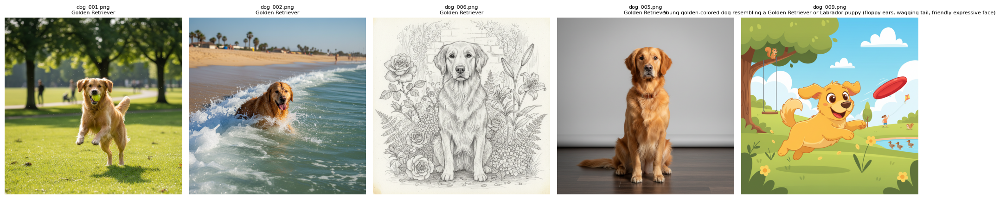

In [ ]:
#Example semantic query
query_1 = search("golden retriever playing outside")
print(query_1[["filename", "breed", "img_style", "mood"]])
show_results(query_1)

      filename                                              breed   img_style  \
0  dog_084.png                                             Beagle  photograph   
1  dog_002.png                                   Golden Retriever  photograph   
2  dog_042.png  Pembroke Welsh Corgi (red/sable coat with prom...  photograph   
3  dog_034.png                                     Siberian Husky  photograph   
4  dog_093.png  Likely a Goldendoodle or Labradoodle (possibly...  photograph   

                                                mood  
0  Joyful, energetic, serene — evokes freedom, pl...  
1  Joyful, energetic, playful — carefree summer r...  
2  Joyful, energetic, carefree, peaceful, idyllic...  
3  Joyful, exhilarating, playful freedom, energet...  
4  Calm observation amidst urban activity — compo...  


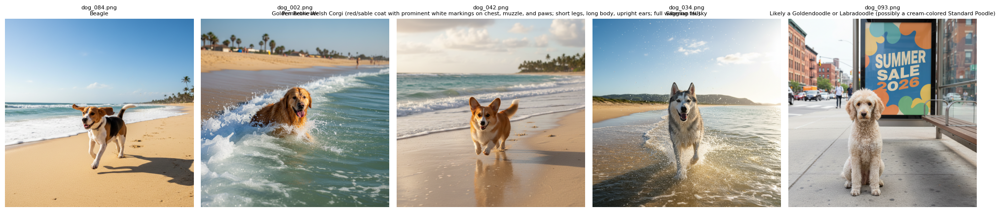

In [ ]:
#Example combined query
query_2 = search("A dog at the beach", artistic_style = "photograph")
print(query_2[["filename", "breed", "img_style", "mood"]])
show_results(query_2)

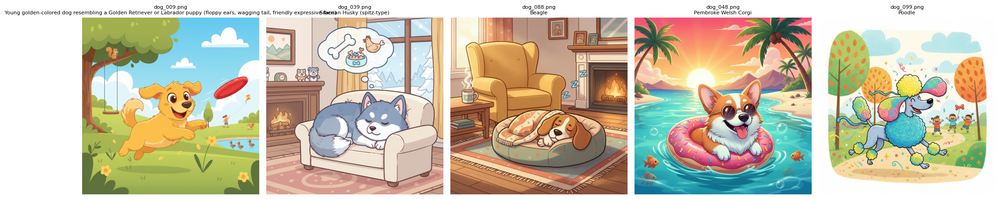

      filename                                              breed img_style
0  dog_009.png  Young golden-colored dog resembling a Golden R...   cartoon
1  dog_039.png                        Siberian Husky (spitz-type)   cartoon
2  dog_088.png                                             Beagle   cartoon
3  dog_048.png                               Pembroke Welsh Corgi   cartoon
4  dog_099.png                                             Poodle   cartoon


In [ ]:
#Example combined query
query_3=search("cute small dog", artistic_style="cartoon")
show_results(query_3)
print(query_3[["filename", "breed", "img_style"]])

In [35]:
golden_answers = [
    {
        "query": "golden retriever playing outside",
        "filters": {},
        "expected_files": ["dog_001.png ", "dog_004.png  ", "dog_010.png","dog_002.png","dog_009.png"]  
    },
    {
        "query": "A dog at the beach",
        "filters": {"artistic_style": "photograph"},
        "expected_files": ["dog_084.png", "dog_002.png","dog_042.png","dog_034.png","dog_093.png"]
    },
    {
        "query": "cute small dog",
        "filters": {"artistic_style": "cartoon"},
        "expected_files": ["dog_009.png", "dog_039.png ", "dog_088.png","dog_048.png","dog_099.png"]  
    }
]

In [36]:
def evaluate(golden_answers, top_k=5):
    for item in golden_answers:
        results = search(
            query=item["query"],
            top_k=top_k,
            **item["filters"]  # unpack filter dict → artistic_style=..., breed=...
        )
        
        returned = set(results["filename"].tolist())
        expected = set(item["expected_files"])
        hits = returned & expected
        
        precision = len(hits) / len(returned)
        recall = len(hits) / len(expected)
        
        print(f"Query: '{item['query']}' | Filters: {item['filters']}")
        print(f"Precision@{top_k}: {precision:.0%} | Recall@{top_k}: {recall:.0%}\n")

In [37]:
evaluate(golden_answers)

Query: 'golden retriever playing outside' | Filters: {}
Precision@5: 40% | Recall@5: 40%

Query: 'A dog at the beach' | Filters: {'artistic_style': 'photograph'}
Precision@5: 100% | Recall@5: 100%

Query: 'cute small dog' | Filters: {'artistic_style': 'cartoon'}
Precision@5: 80% | Recall@5: 80%



## 4. Evaluation Queries

We will evaluate your index by running queries against it — queries similar in spirit to the examples below, but not identical.

**Important:** Define a function called `query_index(query, filter=None, k=5)` that takes a natural language query, an optional metadata filter string (e.g., `"breed = 'pug'"`), and returns the top-k results as a list of dicts with at least a `"filename"` key. We will call this function to test your system.

Filter strings use SQL `WHERE` clause syntax (which LanceDB supports natively), e.g., `"breed = 'pug'"`, `"style = 'cartoon'"`, `"has_text = true"`.

### Example semantic queries
```python
query_index("a happy dog at the beach", k=5)
query_index("a dog sitting in a cafe", k=5)
query_index("a pencil drawing of a dog", k=5)
```

### Example filtered queries
```python
query_index("dog", filter="breed = 'corgi'", k=20)
query_index("dog", filter="style = 'cartoon'", k=20)
query_index("dog", filter="setting = 'living_room'", k=20)
query_index("dog", filter="activity = 'eating'", k=20)
```

### Example combined queries
```python
query_index("dog in the snow", filter="breed = 'husky'", k=5)
query_index("cute dog posing", filter="style = 'pencil_sketch'", k=5)
query_index("running on the beach", filter="breed = 'dalmatian'", k=5)
```

Run these example queries and display results clearly — filenames, metadata, and scores.

In [38]:
def query_index(query: str, filter: str = None, k: int = 5) -> list[dict]:
    # Embed query
    query_vector = embedder.encode(query).tolist()
    
    # Search LanceDB
    results = table.search(query_vector).limit(k)
    
    # Add filter
    if filter:
        results = results.where(filter)
    
    # Return list of dicts with filename
    return results.to_pandas().to_dict(orient="records")

In [41]:
def display_results(results: list[dict], query: str, show_images: bool = True):
    print(f"Query: '{query}'")
    print(f"Found {len(results)} results\n")
    
    for i, r in enumerate(results):
        print(f"#{i+1} {r['filename']}")
        print(f"     Breed: {r['breed']} | Style: {r['img_style']} | Setting: {r['setting']}")
        print(f"     Mood: {r['mood']} | Unusual: {r['unusual_ele']}")
        print(f"     Score: {r['_distance']:.4f}") 
        print()
    
    if show_images and len(results) > 0:
        fig, axes = plt.subplots(1, len(results), figsize=(4 * len(results), 4))
        if len(results) == 1:
            axes = [axes]
        for i, r in enumerate(results):
            img = Image.open(f"../data/dogs/{r['filename']}")
            axes[i].imshow(img)
            axes[i].set_title(f"#{i+1} {r['filename']}\nScore: {r['_distance']:.4f}", fontsize=7)
            axes[i].axis("off")
        plt.suptitle(f"Query: '{query}'", fontsize=12)
        plt.tight_layout()
        plt.show()

Query: 'a happy dog at the beach'
Found 5 results

#1 dog_084.png
     Breed: Beagle | Style: photograph | Setting: Expansive golden-sanded tropical/subtropical beach with gentle waves to the left and a line of lush palm trees on the far right coastline under a bright blue sky
     Mood: Joyful, energetic, serene — evokes freedom, playfulness, and simple pleasure of a sunny beach day | Unusual: nan
     Score: 0.7667

#2 dog_002.png
     Breed: Golden Retriever | Style: photograph | Setting: Sunny beach — dog playing in shallow ocean water with splashing waves in the foreground; midground of light golden sand; background with distant palm trees, blurred buildings and tiny figures, under a clear blue sky.
     Mood: Joyful, energetic, playful — carefree summer recreation and excitement. | Unusual: nan
     Score: 0.8172

#3 dog_034.png
     Breed: Siberian Husky | Style: photograph | Setting: Sunny, expansive beach with shallow ocean water; golden-tan sand to the left meeting gentle wav

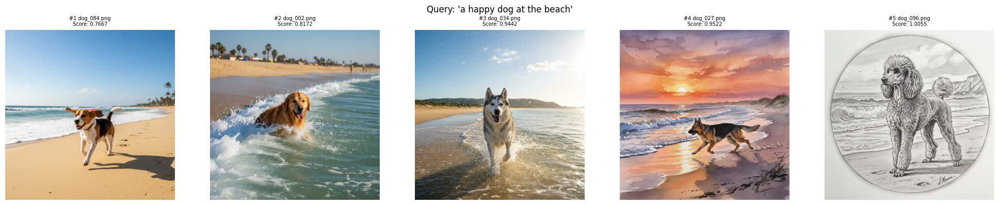

Query: 'a dog sitting in a cafe'
Found 5 results

#1 dog_063.png
     Breed: English Bulldog (white with large brown/tan patches) | Style: photograph | Setting: Outdoor European-style cafe on a cobblestone street: wicker chairs and small round tables with cups and treats, lush potted plants separating tables from the building facade, striped awnings and warm glowing lights on nearby buildings, blurred patrons and pedestrians receding into the street.
     Mood: Warm, inviting, whimsical — relaxed late-afternoon/early-evening atmosphere with soft golden light and a playful, cozy tone. | Unusual: Bulldog sitting upright on a wicker chair at the cafe table, looking like a polite customer with its tongue slightly out; prominent black chalkboard sign reading "SPRING 2026 SPECIALS" with listed items including "- Espresso & Pastry - $8", "- Aperol Spritz - $12", and "- Dog-Friendly Treats - $5", connecting to the dog in the scene.
     Score: 0.9028

#2 dog_078.png
     Breed: Shiba Inu | Sty

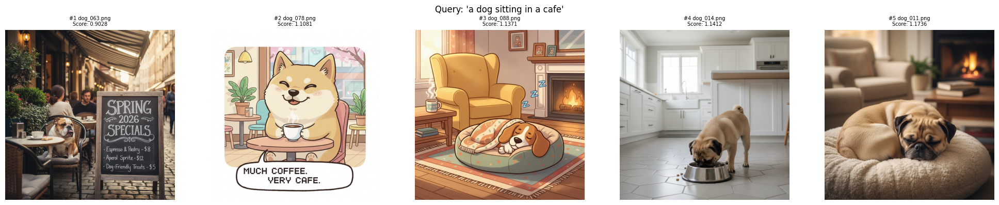

Query: 'a pencil drawing of a dog'
Found 5 results

#1 dog_086.png
     Breed: Beagle | Style: sketch | Setting: Deciduous forest with bare tree trunks, fallen leaves and sparse twiggy undergrowth (suggesting late autumn/winter)
     Mood: Pensive, solemn, slightly melancholic; introspective and tranquil | Unusual: Hand-torn rough paper edges on all sides; no visible text or signatures
     Score: 0.5613

#2 dog_066.png
     Breed: English Bulldog | Style: sketch | Setting: Portrait from the chest up, isolated against a pure white background
     Mood: Calm, gentle solemnity and pensiveness with a quiet, dignified presence | Unusual: nan
     Score: 0.5671

#3 dog_026.png
     Breed: German Shepherd | Style: sketch | Setting: Minimalist, light textured backdrop (suggests a wall or curtain); faint darker vertical bands at left, lighter at right
     Mood: Alert, focused, intelligent, composed and watchful | Unusual: Artist signature "A. Richter" in neat cursive at bottom right
     Scor

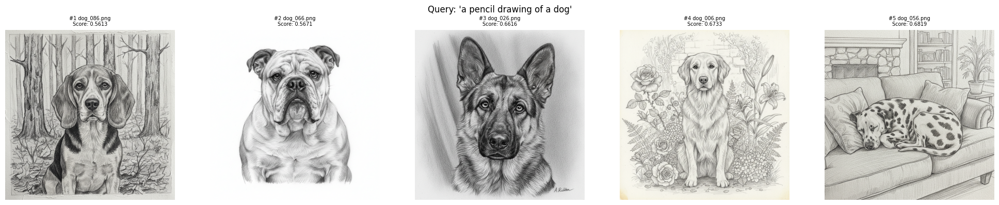

Query: 'dog | filter: breed = 'corgi''
Found 0 results

Query: 'dog | filter: img_style = 'cartoon''
Found 10 results

#1 dog_029.png
     Breed: German Shepherd | Style: cartoon | Setting: Sunny outdoor park/open field with lush green grass dotted with yellow and white flowers; two cartoon trees framing the scene; bushes and foliage in midground; brilliant blue sky with stylized white clouds and a peeking yellow sun in the upper right.
     Mood: Joyful, energetic, playful — happy, excited, and dynamic (dog running toward a frisbee). | Unusual: Large bold yellow bubbly text reading "BARANBY" arched across the top of the sky with darker yellow/orange outline and shadow; black movement lines trailing the frisbee and around the dog's legs/tail; deep stylized shadow beneath the running dog; subtle halftone/digital noise texture over fills.
     Score: 1.0989

#2 dog_059.png
     Breed: Dalmatian | Style: cartoon | Setting: City street at sunrise/sunset with asphalt road, white lane markin

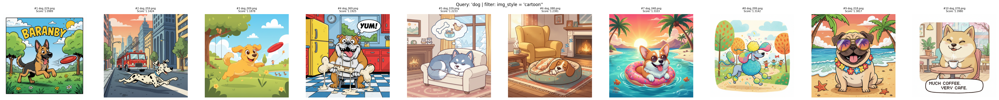

Query: 'dog | filter: setting = 'living_room''
Found 0 results

Query: 'dog in the snow | filter: breed = 'husky''
Found 0 results

Query: 'cute dog posing | filter: img_style = 'pencil_sketch''
Found 0 results

Query: 'running on the beach | filter: breed = 'dalmatian''
Found 0 results



In [45]:
# Semantic queries
for query in [
    "a happy dog at the beach",
    "a dog sitting in a cafe", 
    "a pencil drawing of a dog"
]:
    results = query_index(query, k=5)
    display_results(results, query)

# Filtered queries
filtered_queries = [
    ("dog", "breed = 'corgi'", 20),
    ("dog", "img_style = 'cartoon'", 20),
    ("dog", "setting = 'living_room'", 20),
   #("dog", "activity = 'eating'", 20)
]
for query, filter_str, k in filtered_queries:
    results = query_index(query, filter=filter_str, k=k)
    display_results(results, f"{query} | filter: {filter_str}")

# Combined queries
combined_queries = [
    ("dog in the snow", "breed = 'husky'", 5),
    ("cute dog posing", "img_style = 'pencil_sketch'", 5),
    ("running on the beach", "breed = 'dalmatian'", 5),
]
for query, filter_str, k in combined_queries:
    results = query_index(query, filter=filter_str, k=k)
    display_results(results, f"{query} | filter: {filter_str}")

## 5. Submission

- [ ] Create a new branch called `homework-6`
- [ ] Commit and push your work (notebook + CSV files in `temp/`)
- [ ] Create a Pull Request
- [ ] Merge the PR to main
- [ ] Submit the `.ipynb` file on Blackboard

**Note:** Commit the notebook and the `temp/` files that your code created. The `temp/` directory is gitignored by default, so you will need to force-add it: `git add -f temp/`.